In [1]:
import sys

import meta_dataloader.TCGA

import numpy as np
import data.gene_graphs
import collections
import sklearn.metrics
import sklearn.model_selection
import random
from collections import OrderedDict
import pandas as pd
from torch.optim import Optimizer
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torch import Tensor
import matplotlib.pyplot as plt
from pylab import rcParams

%load_ext autoreload
%autoreload 2

In [2]:
tasks = meta_dataloader.TCGA.TCGAMeta(min_samples_per_class=10)

In [4]:
variable_lists= []
cancer_lists=[]
for i in tasks:
    variable_lists.append(i.id[0])
    cancer_lists.append(i.id[1])
print(np.unique(variable_lists))
print(np.unique(cancer_lists))

['Expression_Subtype' 'GeneExp_Subtype' 'Metastasis_nature2012'
 'Node_nature2012' 'PAM50Call_RNAseq' '_EVENT' '_PANCAN_DNAMethyl_BLCA'
 '_PANCAN_DNAMethyl_BRCA' '_PANCAN_DNAMethyl_HNSC'
 '_PANCAN_DNAMethyl_LUAD' '_PANCAN_DNAMethyl_LUSC' '_PANCAN_mirna_BLCA'
 '_PANCAN_mirna_BRCA' '_PANCAN_mirna_HNSC' '_PANCAN_mirna_LAML'
 '_PANCAN_mirna_LUAD' '_PANCAN_mirna_LUSC' '_PANCAN_mirna_OV'
 'acute_myeloid_leukemia_calgb_cytogenetics_risk_category'
 'adjacent_hepatic_tissue_inflammation_extent_type'
 'alcohol_history_documented' 'anatomic_neoplasm_subdivision'
 'animal_insect_allergy_history' 'antireflux_treatment' 'asthma_history'
 'atypical_mitotic_figures' 'barretts_esophagus' 'biochemical_recurrence'
 'birth_control_pill_history_usage_category' 'clinical_M' 'clinical_stage'
 'colon_polyps_present' 'diabetes' 'family_history_of_cancer'
 'family_history_of_primary_brain_tumor'
 'family_history_of_stomach_cancer' 'family_history_other_cancer' 'gender'
 'histological_type' 'hypertension' 'icd_1

In [5]:
print(len(np.unique(variable_lists)), len(np.unique(cancer_lists)))

57 35


In [3]:
class MultiLayerPerceptron(torch.nn.Module):
    def __init__(self, seed, input_size, num_classes, num_layers, channels, learning_rate, batch_size, epochs, patience, weight_decay):
        super(MultiLayerPerceptron, self).__init__()
        self.input_size = input_size
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.epochs = epochs
        self.patience = patience
        self.weight_decay = weight_decay
        self.num_layers = num_layers
        self.channels = channels
        self.output_size = num_classes
        random.seed(seed)
        torch.manual_seed(seed)
        
        nodes = []
        nodes += channels
        architecture = OrderedDict()
        for i in range(self.num_layers):
            architecture['fc' + str(i)] = nn.Linear(input_size, nodes[i])
            architecture['relu' + str(i)] = torch.nn.ReLU()
            input_size = nodes[i]

        self.features = nn.Sequential(architecture)

        #self.classifier = None
    
    @property
    def criterion(self):
        criterion = F.cross_entropy
        return criterion
    
    @property
    def optimizer(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate, weight_decay=self.weight_decay)
        return optimizer

    def forward(self, x):
        x = x.view(-1, self.input_size)
        features = self.features(x)
        return features
      

In [5]:
def load_sets(task, valid=False):
     
    X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(task._samples, 
                                                                                task._labels, 
                                                                                stratify=task._labels,
                                                                                train_size=50,
                                                                                test_size=100,
                                                                                shuffle=True,
                                                                                random_state=0
                                                                                 )
                                                                                   
    mean = np.mean(X_train)
    std = np.std(X_train)
    X_train = (X_train - mean) / std
    X_test = (X_test - mean) / std
    train_set = TensorDataset( Tensor(X_train), Tensor(y_train))
    test_set = TensorDataset( Tensor(X_test), Tensor(y_test))

    if valid:
        X_test, X_valid, y_test, y_valid = sklearn.model_selection.train_test_split(X_test, 
                                                                                y_test, 
                                                                                stratify=y_test,
                                                                                train_size=50,
                                                                                test_size=50,
                                                                                shuffle=True,
                                                                                random_state=0
                                                                               )
        valid_set = TensorDataset( Tensor(X_valid), Tensor(y_valid))
        return train_set, valid_set, test_set
    
    return train_set, test_set 

In [4]:
def train(model, dataset, stop_early=False):
    train_loss = []
    criterion = model.criterion
    if type(model).__name__ == "LogisticRegression":
        optimizer = torch.optim.LBFGS(model.parameters(), lr=1)
    else:
        optimizer = torch.optim.Adam(model.parameters(), lr=model.learning_rate, weight_decay= model.weight_decay)
     
    if stop_early:
        print("")
    else:
        train_set = dataset
        valid_set = None
 
    for i in range(model.epochs):
        for batch, labels in torch.utils.data.DataLoader(train_set, batch_size=model.batch_size, shuffle=True):
            labels = torch.autograd.Variable(labels.long())
            
            def closure():
                # Forward + Backward + Optimize
                optimizer.zero_grad()
                out = model(batch)
                loss = criterion(out, labels)
                loss.backward()
                return loss
            
            intermediate = optimizer.step(closure)
            loss = intermediate.item()
            train_loss.append(loss)

    return model, loss

In [6]:
def test(model, test_set):
    # Test the Model
    batch, labels = next(iter(torch.utils.data.DataLoader(test_set, batch_size=len(test_set), shuffle=False)))
    model.eval()
    outputs = model(batch)
    _, predicted = torch.max(outputs.data, 1)

    predicted = predicted.numpy()
    labels = labels.numpy()
    accuracy = (predicted == labels).mean()*100.
    return accuracy

In [7]:
def filter_tasks(tasks_list):
    filtered_tasks_sample = []
    for task in tasks_list: 
        try:
            load_sets(task)
            filtered_tasks_sample.append(task)
        except:
            print("Not enough number of samples in task {}" .format(task.id))
    return filtered_tasks_sample

In [8]:
def get_protoloss(prototypes, query_set, query_labels, num_classes):
    dists = torch.sum((query_set.unsqueeze(1) - prototypes.unsqueeze(0)) ** 2, dim=2)
    protoloss = F.cross_entropy(-dists, query_labels)

    return protoloss

In [9]:
def proto_predict(prototypes, query_set, query_labels, n_classes):  # TODO : a quick fix!
    dists = torch.sum((query_set.unsqueeze(1) - prototypes.unsqueeze(0)) ** 2, dim=2)
    _, index = torch.min(dists, dim=1)
    accuracy = ((index == query_labels).sum().float() / len(query_labels)) * 100
    num_of_correct_preds = (index == query_labels).sum()
    return accuracy, num_of_correct_preds

In [10]:
def sum_batch_metric(batch_loss, batch_acc, loss, acc):
    batch_loss += loss
    batch_acc += acc

    return batch_loss, batch_acc

In [11]:
def div_batch_metric(batch_loss, batch_acc, length):
    batch_loss /= length
    batch_acc /= length

    return batch_loss, batch_acc

In [12]:
def load_batch(dataset, batch_size):
    batch, labels = next(iter(torch.utils.data.DataLoader(dataset, batch_size=batch_size)))

    return batch, labels.long()

In [13]:
def get_prototypes(support_set, support_labels, num_classes):
    prototypes = torch.zeros((num_classes, support_set.size(1))) 
    index = support_labels.unsqueeze(1).expand_as(support_set)
    prototypes.scatter_add_(0, index, support_set)
    prototypes.div_(float(support_set.size(0)))

    return prototypes

In [14]:
def proto_visualization(data, protos, labels, loss, task_id):
    data = data.detach()
    plt.scatter(data[:, 0], data[:, 1], c=labels)
    proto_np_arr = [p.detach().numpy() for p in protos]
    proto_arr = np.array(proto_np_arr)
    plt.scatter(proto_arr[:,0], proto_arr[:,1], marker='^', s=200, c=[labels[-1], labels[0]])
    plt.title("train labels distribution and the protos for {}" .format(task_id))
    #text(labels=namebank, cex= 0.7)
    plt.grid()
    #logger.save_image(self, tensor=, name=task_dataset.id + ‘’)
    plt.show()

In [15]:
 def prepare_protonet(model, support_batch, query_batch, support_labels, query_labels, n_classes, optimizer, taskid):

        support_embedding = model(support_batch)
        prototypes = get_prototypes(support_embedding, support_labels, n_classes)
        query_embedding = model(query_batch)
        loss = get_protoloss(prototypes, query_embedding, query_labels, n_classes)
        #proto_visualization(support_embedding, prototypes, support_labels, loss, taskid)
        acc, num_corrects = proto_predict(prototypes, query_embedding, query_labels, n_classes)

        return loss, acc, num_corrects, support_embedding, query_embedding, support_labels, query_labels

In [16]:
def meta_train(meta_train_set, optimizer, MLP_model, meta_epochs, meta_batch_size, num_shots):
    result_seeds_acc = []
    avg_train_loss_list, avg_train_acc_list = [], []
    meta_epoch_train_loss, meta_epoch_train_acc = [], []
    train_dataloader = meta_dataloader.TCGA.TCGAMeta.get_dataloader(meta_train_set, batch_size=meta_batch_size, shuffle=True)
    for meta_epoch in range(meta_epochs):
        for meta_batch in train_dataloader:
            optimizer.zero_grad()
            train_batch_loss, train_batch_acc = 0., 0.
            for task in meta_batch:
                print(task.id)
                support, query = load_sets(task)
                n_classes = len(np.unique(task._labels))
                task_id = task.id
                support_batch, support_labels = load_batch(support, num_shots)
                query_batch, query_labels = load_batch(query, len(query))
                loss, acc, _, sup_emb, qu_emb, sup_lb, qu_lb = prepare_protonet(MLP_model, support_batch, query_batch, support_labels, query_labels, n_classes, optimizer, task.id)
                train_batch_loss, train_batch_acc = sum_batch_metric(train_batch_loss, train_batch_acc, loss, acc)

            train_batch_loss, train_batch_acc = div_batch_metric(train_batch_loss, train_batch_acc, len(meta_batch))
            train_batch_loss.backward(retain_graph=True)
            avg_train_loss_list.append(train_batch_loss)
            avg_train_acc_list.append(train_batch_acc)
            optimizer.step()
            print("Train batch loss: {}".format(train_batch_loss))
            print("Train batch acc: {}".format(train_batch_acc))
            meta_epoch_train_acc.append(train_batch_acc.tolist())     
    avg_train_loss = sum(avg_train_loss_list) / len(avg_train_loss_list)
    avg_train_acc = sum(avg_train_acc_list) / len(avg_train_acc_list)
    print('avg train loss with num_shots = {} : {}' .format(num_shots, avg_train_loss))
    print('avg train acc with num_shots = {} : {}' .format(num_shots, avg_train_acc))
    
    rcParams['figure.figsize'] = 5, 3

    plt.rcParams.update({'font.size':11})
    plt.plot(np.arange(len(avg_train_loss_list)),avg_train_loss_list, c='r')
    plt.xlabel('number of epochs')
    plt.ylabel('meta train loss')
    plt.grid()
    plt.ylim(0., 5)
    plt.xlim(0,160)
    plt.show()

    plt.plot(np.arange(len(avg_train_acc_list)),avg_train_acc_list, c='b')
    plt.xlabel('number of epochs')
    plt.ylabel('accuracy')
    plt.grid()
    plt.ylim(0., 100)
    plt.xlim(0,160)
    plt.show()
    
    minimum_loss = train_batch_loss.item()
    result_seeds_acc.append(avg_train_acc)
    
    return MLP_model, minimum_loss, avg_train_loss, avg_train_acc, result_seeds_acc

In [17]:
def meta_test(model, meta_test_set, optimizer, meta_batch_size):
    """
        Test the model trained with prototypical learning algorithm
    """
    result_dict = {}
    #device = 'cuda:0' if torch.cuda.is_available() and args.cuda else 'cpu'
    test_dataloader = meta_dataloader.TCGA.TCGAMeta.get_dataloader(meta_test_set, batch_size=meta_batch_size, shuffle=True)
    all_correct_preds = 0.
    all_test_samples = 0.
    for meta_test_batch in test_dataloader:
        for task in meta_test_batch:
            support, query = load_sets(task)
            n_classes = len(np.unique(task._labels))
            print(task.id)
            support_batch, support_labels = load_batch(support, len(support))
            query_batch, query_labels = load_batch(query, len(query))
            model.eval()
            _, acc, num_correct_preds, sup_emb, qu_emb, sup_lb, qu_lb = prepare_protonet(model, support_batch, query_batch, support_labels, query_labels,
                                             n_classes, optimizer, task.id)
            result_dict['(\''+task.id[0]+'\'' + ', ' + '\'' + task.id[-1] + '\')'] = [acc.item()/100.] + [len(support), len(query),  n_classes]
            print("test acc:{}".format(acc.item()))
        all_correct_preds += num_correct_preds.item()
        all_test_samples += len(query)
    avg_acc = (all_correct_preds / all_test_samples) * 100.0
    print("\nAvg test acc:{}" .format(avg_acc))
    return avg_acc, result_dict

In [18]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

def visualize_result(result_dict):
    tasks, values= [], []
    for i in range(len(result_dict)):
        tasks.append(result_dict[i][0])
        values.append(result_dict[i][1][0]*100)

    plt.rcParams.update({'font.size':40})
    x = np.arange(len(tasks))
    fig, ax = plt.subplots(figsize=(100, 30), dpi=150)

    width = 0.5
    ax.bar(x, values, width, alpha=0.7, color='g', label='Meta model')
    ax.set_ylabel('Accuracy')
    ax.set_title('Meta-Learner Performances over clinical tasks')
    ax.set_xticks([p for p in x])
    ax.set_xticklabels(tasks, rotation=45, ha="right")
    plt.grid()
    fig.tight_layout()
    plt.show()

In [19]:
#After hyperparameter search (in another notebook)
epochs = 250
patience = 10
batch_size = 32
lr= 0.0001 # best_lr
num_layer = 2 # best num_layer
channels = [128,64] # best channels
weight_decay = 0.0
num_classes = 2
input_size = tasks[0]._samples.shape[1]
seed = 0
meta_valid_set = []
embedding_size=100

In [20]:
valid_tasks = filter_tasks(tasks)
random.seed(9999)
random.shuffle(valid_tasks)
ratio = int(0.8* len(valid_tasks))
meta_train_set = valid_tasks[:ratio]
meta_test_set = valid_tasks[ratio:]
print(len(meta_train_set), len(meta_test_set))

Not enough number of samples in task ('gender', 'UVM')
Not enough number of samples in task ('_EVENT', 'UVM')
Not enough number of samples in task ('histological_type', 'UVM')
Not enough number of samples in task ('gender', 'READ')
Not enough number of samples in task ('_EVENT', 'READ')
Not enough number of samples in task ('lymphatic_invasion', 'READ')
Not enough number of samples in task ('venous_invasion', 'READ')
Not enough number of samples in task ('colon_polyps_present', 'READ')
Not enough number of samples in task ('gender', 'ACC')
Not enough number of samples in task ('_EVENT', 'ACC')
Not enough number of samples in task ('oct_embedded', 'ACC')
Not enough number of samples in task ('clinical_M', 'ACC')
Not enough number of samples in task ('necrosis', 'ACC')
Not enough number of samples in task ('weiss_venous_invasion', 'ACC')
Not enough number of samples in task ('atypical_mitotic_figures', 'ACC')
Not enough number of samples in task ('hypertension', 'UCEC')
Not enough number

In [22]:
for task in meta_train_set:
    print(task.id)

('PAM50Call_RNAseq', 'BRCA')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('family_history_of_cancer', 'GBMLGG')
('_EVENT', 'LUAD')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('asthma_history', 'GBMLGG')
('gender', 'BLCA')
('mental_status_changes', 'LGG')
('_EVENT', 'KIRP')
('_PANCAN_mirna_BRCA', 'BRCA')
('oct_embedded', 'HNSC')
('gender', 'ESCA')
('alcohol_history_documented', 'PAAD')
('venous_invasion', 'COAD')
('animal_insect_allergy_history', 'GBMLGG')
('gender', 'LAML')
('synchronous_colon_cancer_present', 'COAD')
('synchronous_colon_cancer_present', 'COADREAD')
('gender', 'SARC')
('gender', 'COADREAD')
('alcohol_history_documented', 'HNSC')
('gender', 'GBMLGG')
('birth_control_pill_history_usage_category', 'CESC')
('oct_embedded', 'STAD')
('family_history_of_stomach_cancer', 'STAD')
('oct_embedded', 'LGG')
('alcohol_history_documented', 'ESCA')
('biochemical_recurrence', 'PRAD')
('_PANCAN_mirna_LUSC', 'LUSC')
('oct_embedded', 'PRAD')
('_PANCAN_DNAMethyl_LUSC', 'LUS

In [22]:
for task in meta_test_set:
    print(task.id)

('oct_embedded', 'SARC')
('oct_embedded', 'SKCM')
('gender', 'LIHC')
('gender', 'LUNG')
('oct_embedded', 'LIHC')
('histological_type', 'LGG')
('lymphovascular_invasion_present', 'HNSC')
('histological_type', 'PCPG')
('family_history_of_cancer', 'LGG')
('adjacent_hepatic_tissue_inflammation_extent_type', 'LIHC')
('gender', 'COAD')
('gender', 'THCA')
('oct_embedded', 'THCA')
('_EVENT', 'GBMLGG')
('colon_polyps_present', 'COADREAD')
('Metastasis_nature2012', 'BRCA')
('anatomic_neoplasm_subdivision', 'OV')
('_PANCAN_mirna_LUAD', 'LUAD')
('mental_status_changes', 'GBMLGG')
('oct_embedded', 'UCEC')
('_PANCAN_DNAMethyl_HNSC', 'HNSC')
('_PANCAN_mirna_LAML', 'LAML')
('lymphovascular_invasion_present', 'BLCA')
('histological_type', 'UCEC')
('gender', 'BRCA')


('mental_status_changes', 'LGG')
('asthma_history', 'GBMLGG')
('gender', 'BLCA')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('_PANCAN_mirna_BRCA', 'BRCA')
Train batch loss: 1.0105292797088623
Train batch acc: 61.599998474121094
('PAM50Call_RNAseq', 'BRCA')
('_EVENT', 'LUAD')
('family_history_of_cancer', 'GBMLGG')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('_EVENT', 'KIRP')
Train batch loss: 10.11591625213623
Train batch acc: 55.0
('asthma_history', 'GBMLGG')
('gender', 'BLCA')
('PAM50Call_RNAseq', 'BRCA')
('_EVENT', 'KIRP')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
Train batch loss: 1.479871153831482
Train batch acc: 63.400001525878906
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('_EVENT', 'LUAD')
('family_history_of_cancer', 'GBMLGG')
('_PANCAN_mirna_BRCA', 'BRCA')
('mental_status_changes', 'LGG')
Train batch loss: 1.5805140733718872
Train batch acc: 52.400001525878906
('family_history_of_cancer', 'GBMLGG')
('mental_status_changes', 'LGG')
('PAM50Cal

('PAM50Call_RNAseq', 'BRCA')
('_PANCAN_mirna_BRCA', 'BRCA')
('_EVENT', 'LUAD')
('mental_status_changes', 'LGG')
Train batch loss: 1.1177079677581787
Train batch acc: 47.20000076293945
('mental_status_changes', 'LGG')
('PAM50Call_RNAseq', 'BRCA')
('_PANCAN_mirna_BRCA', 'BRCA')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('_EVENT', 'KIRP')
Train batch loss: 1.1822489500045776
Train batch acc: 53.20000076293945
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('asthma_history', 'GBMLGG')
('_EVENT', 'LUAD')
('family_history_of_cancer', 'GBMLGG')
('gender', 'BLCA')
Train batch loss: 0.6649625301361084
Train batch acc: 62.599998474121094
('_PANCAN_mirna_BRCA', 'BRCA')
('_EVENT', 'LUAD')
('PAM50Call_RNAseq', 'BRCA')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('gender', 'BLCA')
Train batch loss: 1.1157104969024658
Train batch acc: 46.79999923706055
('family_history_of_cancer', 'GBMLGG')
('_EVENT', 'KIRP')
('asthma_history', 'GBMLGG')
('_PANCAN_DNAMethyl_BRCA'

('asthma_history', 'GBMLGG')
('_EVENT', 'KIRP')
Train batch loss: 0.8263216018676758
Train batch acc: 58.599998474121094
('PAM50Call_RNAseq', 'BRCA')
('family_history_of_cancer', 'GBMLGG')
('gender', 'BLCA')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('mental_status_changes', 'LGG')
Train batch loss: 0.9535461664199829
Train batch acc: 58.400001525878906
('PAM50Call_RNAseq', 'BRCA')
('gender', 'BLCA')
('_EVENT', 'LUAD')
('_PANCAN_mirna_BRCA', 'BRCA')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
Train batch loss: 1.067365288734436
Train batch acc: 46.599998474121094
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('_EVENT', 'KIRP')
('family_history_of_cancer', 'GBMLGG')
('mental_status_changes', 'LGG')
('asthma_history', 'GBMLGG')
Train batch loss: 0.6990110874176025
Train batch acc: 70.5999984741211
('PAM50Call_RNAseq', 'BRCA')
('family_history_of_cancer', 'GBMLGG')
('mental_status_changes', 'LGG')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('_PANCAN_mirna_BR

('PAM50Call_RNAseq', 'BRCA')
('gender', 'BLCA')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('asthma_history', 'GBMLGG')
Train batch loss: 0.9236863851547241
Train batch acc: 64.19999694824219
('_PANCAN_mirna_BRCA', 'BRCA')
('gender', 'BLCA')
('mental_status_changes', 'LGG')
('PAM50Call_RNAseq', 'BRCA')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
Train batch loss: 1.1351020336151123
Train batch acc: 54.400001525878906
('asthma_history', 'GBMLGG')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('_EVENT', 'LUAD')
('_EVENT', 'KIRP')
('family_history_of_cancer', 'GBMLGG')
Train batch loss: 0.5588838458061218
Train batch acc: 74.5999984741211
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('gender', 'BLCA')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('mental_status_changes', 'LGG')
('PAM50Call_RNAseq', 'BRCA')
Train batch loss: 0.9566858410835266
Train batch acc: 59.0
('_PANCAN_mirna_BRCA', 'BRCA')
('_EVENT', 'LUAD')
('asthma_history', 'GBMLGG')
('_EVENT', 'KIRP')
('family_h

('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('PAM50Call_RNAseq', 'BRCA')
('gender', 'BLCA')
Train batch loss: 0.9049943685531616
Train batch acc: 60.400001525878906
('mental_status_changes', 'LGG')
('_PANCAN_mirna_BRCA', 'BRCA')
('PAM50Call_RNAseq', 'BRCA')
('family_history_of_cancer', 'GBMLGG')
('_EVENT', 'KIRP')
Train batch loss: 0.8778279423713684
Train batch acc: 62.0
('gender', 'BLCA')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('asthma_history', 'GBMLGG')
('_EVENT', 'LUAD')
Train batch loss: 0.7246227264404297
Train batch acc: 69.80000305175781
avg train loss with num_shots = 5 : 0.955839216709137
avg train acc with num_shots = 5 : 60.88267517089844


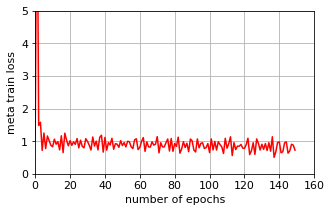

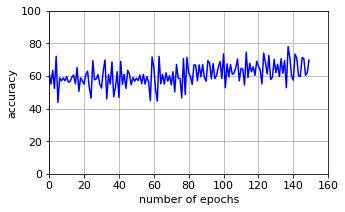

('_PANCAN_mirna_LAML', 'LAML')
test acc:33.0
('gender', 'LIHC')
test acc:66.0
('lymphovascular_invasion_present', 'BLCA')
test acc:55.0
('anatomic_neoplasm_subdivision', 'OV')
test acc:73.0
('oct_embedded', 'LIHC')
test acc:65.0
('gender', 'BRCA')
test acc:80.0
('gender', 'COAD')
test acc:58.0
('oct_embedded', 'SARC')
test acc:85.0
('gender', 'THCA')
test acc:73.0
('histological_type', 'UCEC')
test acc:62.0
('_PANCAN_DNAMethyl_HNSC', 'HNSC')
test acc:41.0
('oct_embedded', 'UCEC')
test acc:65.0
('Metastasis_nature2012', 'BRCA')
test acc:82.0
('histological_type', 'PCPG')
test acc:82.0
('family_history_of_cancer', 'LGG')
test acc:65.0
('oct_embedded', 'THCA')
test acc:58.0
('mental_status_changes', 'GBMLGG')
test acc:76.0
('histological_type', 'LGG')
test acc:39.0
('oct_embedded', 'SKCM')
test acc:80.0
('colon_polyps_present', 'COADREAD')
test acc:71.0
('gender', 'LUNG')
test acc:65.0
('_PANCAN_mirna_LUAD', 'LUAD')
test acc:38.0
('adjacent_hepatic_tissue_inflammation_extent_type', 'LIHC'

In [23]:
meta_epochs = 75
meta_batch_size = 5
num_shots = 5
MLP_model = MultiLayerPerceptron(seed, input_size, num_classes, num_layer, channels, lr, batch_size, epochs, patience, weight_decay)
optimizer= torch.optim.Adam(params=MLP_model.parameters(), lr=MLP_model.learning_rate)
trained_model, _, _, _, _ = meta_train(meta_train_set[:10], optimizer, MLP_model, meta_epochs, meta_batch_size, num_shots)
avg_test_acc , result_dict = meta_test(trained_model, meta_test_set, optimizer, meta_batch_size)
sorted_x = sorted(result_dict.items(), key=lambda kv: kv[1])
sorted_dict = collections.OrderedDict(sorted_x)
print(sorted_x)
visualize_result(sorted_x)

('synchronous_colon_cancer_present', 'COADREAD')
('alcohol_history_documented', 'PAAD')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('gender', 'BLCA')
('mental_status_changes', 'LGG')
Train batch loss: 0.7727010250091553
Train batch acc: 63.400001525878906
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('gender', 'LAML')
('_EVENT', 'KIRP')
('gender', 'ESCA')
('venous_invasion', 'COAD')
Train batch loss: 3.7329978942871094
Train batch acc: 62.400001525878906
('asthma_history', 'GBMLGG')
('PAM50Call_RNAseq', 'BRCA')
('synchronous_colon_cancer_present', 'COAD')
('_PANCAN_mirna_BRCA', 'BRCA')
('animal_insect_allergy_history', 'GBMLGG')
Train batch loss: 1.7935186624526978
Train batch acc: 72.19999694824219
('family_history_of_cancer', 'GBMLGG')
('gender', 'COADREAD')
('_EVENT', 'LUAD')
('oct_embedded', 'HNSC')
('gender', 'SARC')
Train batch loss: 0.7484224438667297
Train batch acc: 54.599998474121094
('_EVENT', 'KIRP')
('animal_insect_allergy_history', 'GBMLGG')
('PAM50Call_RNA

Train batch loss: 0.34604811668395996
Train batch acc: 89.0
('gender', 'COADREAD')
('gender', 'SARC')
('oct_embedded', 'HNSC')
('_PANCAN_mirna_BRCA', 'BRCA')
('asthma_history', 'GBMLGG')
Train batch loss: 0.8687769174575806
Train batch acc: 54.79999923706055
('venous_invasion', 'COAD')
('PAM50Call_RNAseq', 'BRCA')
('_EVENT', 'KIRP')
('gender', 'BLCA')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
Train batch loss: 0.8344162702560425
Train batch acc: 60.0
('family_history_of_cancer', 'GBMLGG')
('alcohol_history_documented', 'PAAD')
('_EVENT', 'LUAD')
('gender', 'LAML')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
Train batch loss: 0.9348881840705872
Train batch acc: 48.0
('_PANCAN_mirna_BRCA', 'BRCA')
('synchronous_colon_cancer_present', 'COADREAD')
('oct_embedded', 'HNSC')
('gender', 'BLCA')
('gender', 'SARC')
Train batch loss: 0.8239132165908813
Train batch acc: 59.0
('_EVENT', 'LUAD')
('mental_status_changes', 'LGG')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('PAM50Call_RNAseq',

('venous_invasion', 'COAD')
Train batch loss: 0.7323713898658752
Train batch acc: 72.4000015258789
('family_history_of_cancer', 'GBMLGG')
('alcohol_history_documented', 'PAAD')
('asthma_history', 'GBMLGG')
('mental_status_changes', 'LGG')
('_EVENT', 'LUAD')
Train batch loss: 0.5963253974914551
Train batch acc: 66.5999984741211
('venous_invasion', 'COAD')
('alcohol_history_documented', 'PAAD')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('_EVENT', 'LUAD')
('synchronous_colon_cancer_present', 'COADREAD')
Train batch loss: 0.748809278011322
Train batch acc: 61.0
('gender', 'SARC')
('gender', 'ESCA')
('oct_embedded', 'HNSC')
('PAM50Call_RNAseq', 'BRCA')
('_PANCAN_mirna_BRCA', 'BRCA')
Train batch loss: 1.060673475265503
Train batch acc: 51.0
('synchronous_colon_cancer_present', 'COAD')
('family_history_of_cancer', 'GBMLGG')
('mental_status_changes', 'LGG')
('gender', 'LAML')
('asthma_history', 'GBMLGG')
Train batch loss: 0.49994173645973206
Train batch acc: 74.4000015258789
('gender', 'COADREAD')
('

('synchronous_colon_cancer_present', 'COAD')
('_EVENT', 'KIRP')
Train batch loss: 0.6234554648399353
Train batch acc: 57.599998474121094
('asthma_history', 'GBMLGG')
('synchronous_colon_cancer_present', 'COADREAD')
('gender', 'ESCA')
('gender', 'COADREAD')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
Train batch loss: 0.6589400172233582
Train batch acc: 71.5999984741211
('_EVENT', 'LUAD')
('gender', 'BLCA')
('_EVENT', 'KIRP')
('family_history_of_cancer', 'GBMLGG')
('animal_insect_allergy_history', 'GBMLGG')
Train batch loss: 0.527144730091095
Train batch acc: 75.4000015258789
('PAM50Call_RNAseq', 'BRCA')
('alcohol_history_documented', 'PAAD')
('oct_embedded', 'HNSC')
('mental_status_changes', 'LGG')
('synchronous_colon_cancer_present', 'COAD')
Train batch loss: 0.7186170816421509
Train batch acc: 60.599998474121094
('gender', 'SARC')
('venous_invasion', 'COAD')
('_PANCAN_mirna_BRCA', 'BRCA')
('gender', 'LAML')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
Train batch loss: 

('synchronous_colon_cancer_present', 'COADREAD')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('animal_insect_allergy_history', 'GBMLGG')
Train batch loss: 0.7131298780441284
Train batch acc: 66.5999984741211
('alcohol_history_documented', 'PAAD')
('venous_invasion', 'COAD')
('gender', 'BLCA')
('synchronous_colon_cancer_present', 'COAD')
('gender', 'LAML')
Train batch loss: 0.5374346971511841
Train batch acc: 66.4000015258789
('family_history_of_cancer', 'GBMLGG')
('mental_status_changes', 'LGG')
('_EVENT', 'LUAD')
('oct_embedded', 'HNSC')
('gender', 'SARC')
Train batch loss: 0.6734227538108826
Train batch acc: 58.79999923706055
('gender', 'COADREAD')
('_EVENT', 'KIRP')
('_PANCAN_mirna_BRCA', 'BRCA')
('PAM50Call_RNAseq', 'BRCA')
('asthma_history', 'GBMLGG')
Train batch loss: 0.9158477783203125
Train batch acc: 62.0
avg train loss with num_shots = 5 : 0.7649932503700256
avg train acc with num_shots = 5 : 63.001304626464844


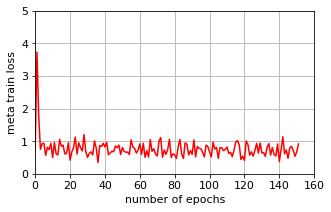

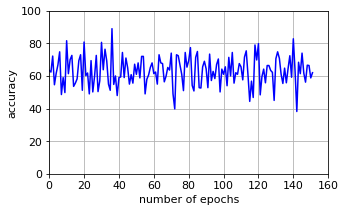

('family_history_of_cancer', 'LGG')
test acc:62.0
('oct_embedded', 'LIHC')
test acc:65.0
('histological_type', 'UCEC')
test acc:61.0
('_PANCAN_DNAMethyl_HNSC', 'HNSC')
test acc:41.0
('mental_status_changes', 'GBMLGG')
test acc:75.0
('lymphovascular_invasion_present', 'HNSC')
test acc:64.0
('oct_embedded', 'UCEC')
test acc:66.0
('anatomic_neoplasm_subdivision', 'OV')
test acc:73.0
('gender', 'LIHC')
test acc:66.0
('Metastasis_nature2012', 'BRCA')
test acc:92.0
('gender', 'THCA')
test acc:73.0
('histological_type', 'LGG')
test acc:38.0
('histological_type', 'PCPG')
test acc:82.0
('lymphovascular_invasion_present', 'BLCA')
test acc:55.0
('_EVENT', 'GBMLGG')
test acc:62.0
('oct_embedded', 'SKCM')
test acc:80.0
('adjacent_hepatic_tissue_inflammation_extent_type', 'LIHC')
test acc:52.0
('oct_embedded', 'SARC')
test acc:85.0
('colon_polyps_present', 'COADREAD')
test acc:71.0
('oct_embedded', 'THCA')
test acc:58.0
('gender', 'BRCA')
test acc:96.0
('gender', 'LUNG')
test acc:60.000003814697266


In [21]:
meta_epochs = 38 
meta_batch_size = 5
num_shots = 5
MLP_model = MultiLayerPerceptron(seed, input_size, num_classes, num_layer, channels, lr, batch_size, epochs, patience, weight_decay)
optimizer= torch.optim.Adam(params=MLP_model.parameters(), lr= MLP_model.learning_rate)
trained_model, _, _, _, _ = meta_train(meta_train_set[:20], optimizer, MLP_model, meta_epochs, meta_batch_size, num_shots)
avg_test_acc , result_dict = meta_test(trained_model, meta_test_set, optimizer, meta_batch_size)
sorted_x = sorted(result_dict.items(), key=lambda kv: kv[1])
sorted_dict = collections.OrderedDict(sorted_x)
print(sorted_x)
visualize_result(sorted_x)

('mental_status_changes', 'LGG')
('synchronous_colon_cancer_present', 'COADREAD')
('animal_insect_allergy_history', 'GBMLGG')
('gender', 'SARC')
('_PANCAN_mirna_BRCA', 'BRCA')
Train batch loss: 0.7771846652030945
Train batch acc: 68.5999984741211
('biochemical_recurrence', 'PRAD')
('venous_invasion', 'COAD')
('alcohol_history_documented', 'ESCA')
('gender', 'ESCA')
('synchronous_colon_cancer_present', 'COAD')
Train batch loss: 3.5506815910339355
Train batch acc: 83.19999694824219
('alcohol_history_documented', 'PAAD')
('gender', 'BLCA')
('birth_control_pill_history_usage_category', 'CESC')
('oct_embedded', 'PRAD')
('PAM50Call_RNAseq', 'BRCA')
Train batch loss: 1.4859461784362793
Train batch acc: 60.20000076293945
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('gender', 'LAML')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('oct_embedded', 'STAD')
('alcohol_history_documented', 'HNSC')
Train batch loss: 1.0390633344650269
Train batch acc: 45.0
('asthma_history', 'GBMLGG')
('f

('biochemical_recurrence', 'PRAD')
('mental_status_changes', 'LGG')
('oct_embedded', 'LGG')
Train batch loss: 0.6993505358695984
Train batch acc: 61.20000076293945
('family_history_of_cancer', 'GBMLGG')
('venous_invasion', 'COAD')
('oct_embedded', 'PRAD')
('gender', 'ESCA')
('_PANCAN_mirna_LUSC', 'LUSC')
Train batch loss: 0.7389038801193237
Train batch acc: 73.80000305175781
('alcohol_history_documented', 'HNSC')
('gender', 'COADREAD')
('family_history_of_stomach_cancer', 'STAD')
('_PANCAN_mirna_BRCA', 'BRCA')
('gender', 'SARC')
Train batch loss: 0.8451554179191589
Train batch acc: 58.599998474121094
('gender', 'GBMLGG')
('gender', 'BLCA')
('birth_control_pill_history_usage_category', 'CESC')
('animal_insect_allergy_history', 'GBMLGG')
('synchronous_colon_cancer_present', 'COADREAD')
Train batch loss: 0.5714454650878906
Train batch acc: 75.19999694824219
('alcohol_history_documented', 'ESCA')
('asthma_history', 'GBMLGG')
('synchronous_colon_cancer_present', 'COAD')
('oct_embedded', 'HN

('oct_embedded', 'PRAD')
('alcohol_history_documented', 'HNSC')
('animal_insect_allergy_history', 'GBMLGG')
Train batch loss: 0.597836434841156
Train batch acc: 69.0
('oct_embedded', 'STAD')
('gender', 'SARC')
('synchronous_colon_cancer_present', 'COADREAD')
('PAM50Call_RNAseq', 'BRCA')
('_PANCAN_mirna_LUSC', 'LUSC')
Train batch loss: 0.8206588625907898
Train batch acc: 60.599998474121094
('_EVENT', 'LUAD')
('family_history_of_cancer', 'GBMLGG')
('_PANCAN_mirna_BRCA', 'BRCA')
('asthma_history', 'GBMLGG')
('alcohol_history_documented', 'ESCA')
Train batch loss: 0.8489338755607605
Train batch acc: 65.0
('oct_embedded', 'HNSC')
('birth_control_pill_history_usage_category', 'CESC')
('gender', 'COADREAD')
('alcohol_history_documented', 'PAAD')
('venous_invasion', 'COAD')
Train batch loss: 0.7343026399612427
Train batch acc: 55.0
('oct_embedded', 'LGG')
('biochemical_recurrence', 'PRAD')
('mental_status_changes', 'LGG')
('gender', 'ESCA')
('_EVENT', 'KIRP')
Train batch loss: 0.51400506496429

('_EVENT', 'LUAD')
('birth_control_pill_history_usage_category', 'CESC')
('family_history_of_cancer', 'GBMLGG')
('animal_insect_allergy_history', 'GBMLGG')
Train batch loss: 0.7579885721206665
Train batch acc: 66.19999694824219
('alcohol_history_documented', 'HNSC')
('PAM50Call_RNAseq', 'BRCA')
('_PANCAN_mirna_BRCA', 'BRCA')
('gender', 'COADREAD')
('gender', 'GBMLGG')
Train batch loss: 1.0529593229293823
Train batch acc: 51.20000076293945
('synchronous_colon_cancer_present', 'COAD')
('venous_invasion', 'COAD')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('alcohol_history_documented', 'ESCA')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
Train batch loss: 0.773063063621521
Train batch acc: 61.20000076293945
('_EVENT', 'KIRP')
('family_history_of_stomach_cancer', 'STAD')
('gender', 'LAML')
('synchronous_colon_cancer_present', 'COADREAD')
('gender', 'ESCA')
Train batch loss: 0.40090832114219666
Train batch acc: 81.5999984741211
('alcohol_history_documented', 'PAAD')
('biochem

('PAM50Call_RNAseq', 'BRCA')
('alcohol_history_documented', 'PAAD')
('animal_insect_allergy_history', 'GBMLGG')
Train batch loss: 0.6495911478996277
Train batch acc: 67.0
('gender', 'ESCA')
('gender', 'GBMLGG')
('alcohol_history_documented', 'ESCA')
('asthma_history', 'GBMLGG')
('gender', 'COADREAD')
Train batch loss: 0.5501094460487366
Train batch acc: 73.19999694824219
('birth_control_pill_history_usage_category', 'CESC')
('_PANCAN_mirna_LUSC', 'LUSC')
('mental_status_changes', 'LGG')
('oct_embedded', 'STAD')
('oct_embedded', 'HNSC')
Train batch loss: 0.8145027160644531
Train batch acc: 59.20000076293945
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('_EVENT', 'KIRP')
('synchronous_colon_cancer_present', 'COADREAD')
('gender', 'SARC')
('_PANCAN_mirna_BRCA', 'BRCA')
Train batch loss: 0.8060210943222046
Train batch acc: 66.0
('gender', 'LAML')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('family_history_of_stomach_cancer', 'STAD')
('_EVENT', 'LUAD')
('oct_embedded', 'PRAD'

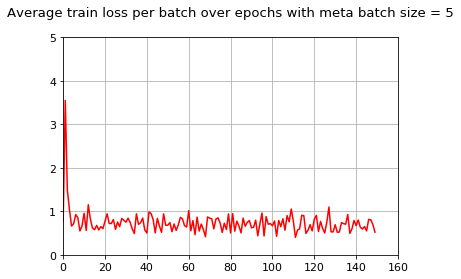

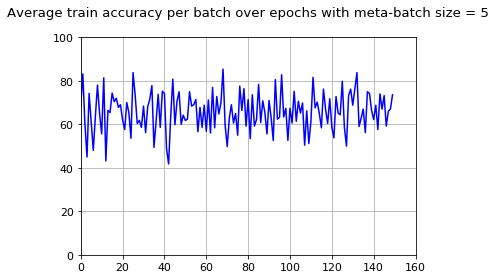

('histological_type', 'PCPG')
test acc:82.0
('colon_polyps_present', 'COADREAD')
test acc:71.0
('gender', 'LUNG')
test acc:60.000003814697266
('histological_type', 'UCEC')
test acc:62.0
('gender', 'BRCA')
test acc:95.0
('oct_embedded', 'THCA')
test acc:58.0
('oct_embedded', 'SKCM')
test acc:80.0
('anatomic_neoplasm_subdivision', 'OV')
test acc:73.0
('family_history_of_cancer', 'LGG')
test acc:62.0
('oct_embedded', 'LIHC')
test acc:65.0
('histological_type', 'LGG')
test acc:38.0
('lymphovascular_invasion_present', 'BLCA')
test acc:55.0
('gender', 'THCA')
test acc:73.0
('lymphovascular_invasion_present', 'HNSC')
test acc:64.0
('oct_embedded', 'SARC')
test acc:85.0
('_PANCAN_DNAMethyl_HNSC', 'HNSC')
test acc:41.0
('_EVENT', 'GBMLGG')
test acc:62.0
('mental_status_changes', 'GBMLGG')
test acc:75.0
('gender', 'COAD')
test acc:54.000003814697266
('_PANCAN_mirna_LUAD', 'LUAD')
test acc:31.0
('gender', 'LIHC')
test acc:66.0
('adjacent_hepatic_tissue_inflammation_extent_type', 'LIHC')
test acc:

('mental_status_changes', 'LGG')
('synchronous_colon_cancer_present', 'COADREAD')
('animal_insect_allergy_history', 'GBMLGG')
('gender', 'SARC')
('_PANCAN_mirna_BRCA', 'BRCA')
Train batch loss: 0.7771846652030945
Train batch acc: 68.5999984741211
('biochemical_recurrence', 'PRAD')
('venous_invasion', 'COAD')
('alcohol_history_documented', 'ESCA')
('gender', 'ESCA')
('synchronous_colon_cancer_present', 'COAD')
Train batch loss: 3.5506815910339355
Train batch acc: 83.19999694824219
('alcohol_history_documented', 'PAAD')
('gender', 'BLCA')
('birth_control_pill_history_usage_category', 'CESC')
('oct_embedded', 'PRAD')
('PAM50Call_RNAseq', 'BRCA')
Train batch loss: 1.4859461784362793
Train batch acc: 60.20000076293945
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('gender', 'LAML')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('oct_embedded', 'STAD')
('alcohol_history_documented', 'HNSC')
Train batch loss: 1.0390633344650269
Train batch acc: 45.0
('asthma_history', 'GBMLGG')
('f

('_EVENT', 'LUAD')
('biochemical_recurrence', 'PRAD')
('mental_status_changes', 'LGG')
('oct_embedded', 'LGG')
Train batch loss: 0.6993505358695984
Train batch acc: 61.20000076293945
('family_history_of_cancer', 'GBMLGG')
('venous_invasion', 'COAD')
('oct_embedded', 'PRAD')
('gender', 'ESCA')
('_PANCAN_mirna_LUSC', 'LUSC')
Train batch loss: 0.7389038801193237
Train batch acc: 73.80000305175781
('alcohol_history_documented', 'HNSC')
('gender', 'COADREAD')
('family_history_of_stomach_cancer', 'STAD')
('_PANCAN_mirna_BRCA', 'BRCA')
('gender', 'SARC')
Train batch loss: 0.8451554179191589
Train batch acc: 58.599998474121094
('gender', 'GBMLGG')
('gender', 'BLCA')
('birth_control_pill_history_usage_category', 'CESC')
('animal_insect_allergy_history', 'GBMLGG')
('synchronous_colon_cancer_present', 'COADREAD')
Train batch loss: 0.5714454650878906
Train batch acc: 75.19999694824219
('alcohol_history_documented', 'ESCA')
('asthma_history', 'GBMLGG')
('synchronous_colon_cancer_present', 'COAD')
(

Train batch loss: 0.597836434841156
Train batch acc: 69.0
('oct_embedded', 'STAD')
('gender', 'SARC')
('synchronous_colon_cancer_present', 'COADREAD')
('PAM50Call_RNAseq', 'BRCA')
('_PANCAN_mirna_LUSC', 'LUSC')
Train batch loss: 0.8206588625907898
Train batch acc: 60.599998474121094
('_EVENT', 'LUAD')
('family_history_of_cancer', 'GBMLGG')
('_PANCAN_mirna_BRCA', 'BRCA')
('asthma_history', 'GBMLGG')
('alcohol_history_documented', 'ESCA')
Train batch loss: 0.8489338755607605
Train batch acc: 65.0
('oct_embedded', 'HNSC')
('birth_control_pill_history_usage_category', 'CESC')
('gender', 'COADREAD')
('alcohol_history_documented', 'PAAD')
('venous_invasion', 'COAD')
Train batch loss: 0.7343026399612427
Train batch acc: 55.0
('oct_embedded', 'LGG')
('biochemical_recurrence', 'PRAD')
('mental_status_changes', 'LGG')
('gender', 'ESCA')
('_EVENT', 'KIRP')
Train batch loss: 0.5140050649642944
Train batch acc: 77.5999984741211
('gender', 'LAML')
('synchronous_colon_cancer_present', 'COAD')
('gende

('animal_insect_allergy_history', 'GBMLGG')
Train batch loss: 0.7579885721206665
Train batch acc: 66.19999694824219
('alcohol_history_documented', 'HNSC')
('PAM50Call_RNAseq', 'BRCA')
('_PANCAN_mirna_BRCA', 'BRCA')
('gender', 'COADREAD')
('gender', 'GBMLGG')
Train batch loss: 1.0529593229293823
Train batch acc: 51.20000076293945
('synchronous_colon_cancer_present', 'COAD')
('venous_invasion', 'COAD')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('alcohol_history_documented', 'ESCA')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
Train batch loss: 0.773063063621521
Train batch acc: 61.20000076293945
('_EVENT', 'KIRP')
('family_history_of_stomach_cancer', 'STAD')
('gender', 'LAML')
('synchronous_colon_cancer_present', 'COADREAD')
('gender', 'ESCA')
Train batch loss: 0.40090832114219666
Train batch acc: 81.5999984741211
('alcohol_history_documented', 'PAAD')
('biochemical_recurrence', 'PRAD')
('gender', 'SARC')
('oct_embedded', 'PRAD')
('oct_embedded', 'LGG')
Train batch loss: 

('alcohol_history_documented', 'PAAD')
('animal_insect_allergy_history', 'GBMLGG')
Train batch loss: 0.6495911478996277
Train batch acc: 67.0
('gender', 'ESCA')
('gender', 'GBMLGG')
('alcohol_history_documented', 'ESCA')
('asthma_history', 'GBMLGG')
('gender', 'COADREAD')
Train batch loss: 0.5501094460487366
Train batch acc: 73.19999694824219
('birth_control_pill_history_usage_category', 'CESC')
('_PANCAN_mirna_LUSC', 'LUSC')
('mental_status_changes', 'LGG')
('oct_embedded', 'STAD')
('oct_embedded', 'HNSC')
Train batch loss: 0.8145027160644531
Train batch acc: 59.20000076293945
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('_EVENT', 'KIRP')
('synchronous_colon_cancer_present', 'COADREAD')
('gender', 'SARC')
('_PANCAN_mirna_BRCA', 'BRCA')
Train batch loss: 0.8060210943222046
Train batch acc: 66.0
('gender', 'LAML')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('family_history_of_stomach_cancer', 'STAD')
('_EVENT', 'LUAD')
('oct_embedded', 'PRAD')
Train batch loss: 0.6956790

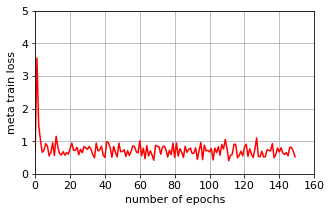

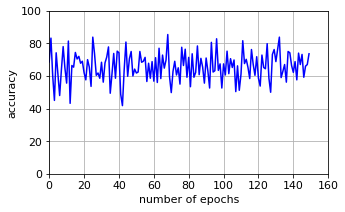

('histological_type', 'PCPG')
test acc:82.0
('colon_polyps_present', 'COADREAD')
test acc:71.0
('gender', 'LUNG')
test acc:60.000003814697266
('histological_type', 'UCEC')
test acc:62.0
('gender', 'BRCA')
test acc:95.0
('oct_embedded', 'THCA')
test acc:58.0
('oct_embedded', 'SKCM')
test acc:80.0
('anatomic_neoplasm_subdivision', 'OV')
test acc:73.0
('family_history_of_cancer', 'LGG')
test acc:62.0
('oct_embedded', 'LIHC')
test acc:65.0
('histological_type', 'LGG')
test acc:38.0
('lymphovascular_invasion_present', 'BLCA')
test acc:55.0
('gender', 'THCA')
test acc:73.0
('lymphovascular_invasion_present', 'HNSC')
test acc:64.0
('oct_embedded', 'SARC')
test acc:85.0
('_PANCAN_DNAMethyl_HNSC', 'HNSC')
test acc:41.0
('_EVENT', 'GBMLGG')
test acc:62.0
('mental_status_changes', 'GBMLGG')
test acc:75.0
('gender', 'COAD')
test acc:54.000003814697266
('_PANCAN_mirna_LUAD', 'LUAD')
test acc:31.0
('gender', 'LIHC')
test acc:66.0
('adjacent_hepatic_tissue_inflammation_extent_type', 'LIHC')
test acc:

In [22]:
meta_epochs = 25
meta_batch_size = 5
num_shots = 5
MLP_model = MultiLayerPerceptron(seed, input_size, num_classes, num_layer, channels, lr, batch_size, epochs, patience, weight_decay)
optimizer= torch.optim.Adam(params=MLP_model.parameters(), lr=MLP_model.learning_rate)
trained_model, _, _, _, _ = meta_train(meta_train_set[:30], optimizer, MLP_model, meta_epochs, meta_batch_size, num_shots)
avg_test_acc , result_dict = meta_test(trained_model, meta_test_set, optimizer, meta_batch_size)
sorted_x = sorted(result_dict.items(), key=lambda kv: kv[1])
sorted_dict = collections.OrderedDict(sorted_x)
print(sorted_x)
visualize_result(sorted_x)

In [ ]:
# Num of shots = 10

('mental_status_changes', 'LGG')
('synchronous_colon_cancer_present', 'COADREAD')
('animal_insect_allergy_history', 'GBMLGG')
('gender', 'SARC')
('_PANCAN_mirna_BRCA', 'BRCA')
Train batch loss: 0.7760408520698547
Train batch acc: 70.4000015258789
('biochemical_recurrence', 'PRAD')
('venous_invasion', 'COAD')
('alcohol_history_documented', 'ESCA')
('gender', 'ESCA')
('synchronous_colon_cancer_present', 'COAD')
Train batch loss: 3.58178973197937
Train batch acc: 83.19999694824219
('alcohol_history_documented', 'PAAD')
('gender', 'BLCA')
('birth_control_pill_history_usage_category', 'CESC')
('oct_embedded', 'PRAD')
('PAM50Call_RNAseq', 'BRCA')
Train batch loss: 1.4814287424087524
Train batch acc: 59.20000076293945
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('gender', 'LAML')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('oct_embedded', 'STAD')
('alcohol_history_documented', 'HNSC')
Train batch loss: 0.957127571105957
Train batch acc: 46.400001525878906
('asthma_history', 'G

('biochemical_recurrence', 'PRAD')
('mental_status_changes', 'LGG')
('oct_embedded', 'LGG')
Train batch loss: 0.6800938248634338
Train batch acc: 61.400001525878906
('family_history_of_cancer', 'GBMLGG')
('venous_invasion', 'COAD')
('oct_embedded', 'PRAD')
('gender', 'ESCA')
('_PANCAN_mirna_LUSC', 'LUSC')
Train batch loss: 0.6593101620674133
Train batch acc: 73.80000305175781
('alcohol_history_documented', 'HNSC')
('gender', 'COADREAD')
('family_history_of_stomach_cancer', 'STAD')
('_PANCAN_mirna_BRCA', 'BRCA')
('gender', 'SARC')
Train batch loss: 0.8173938989639282
Train batch acc: 58.599998474121094
('gender', 'GBMLGG')
('gender', 'BLCA')
('birth_control_pill_history_usage_category', 'CESC')
('animal_insect_allergy_history', 'GBMLGG')
('synchronous_colon_cancer_present', 'COADREAD')
Train batch loss: 0.5388623476028442
Train batch acc: 71.4000015258789
('alcohol_history_documented', 'ESCA')
('asthma_history', 'GBMLGG')
('synchronous_colon_cancer_present', 'COAD')
('oct_embedded', 'HN

('gender', 'BLCA')
('oct_embedded', 'PRAD')
('alcohol_history_documented', 'HNSC')
('animal_insect_allergy_history', 'GBMLGG')
Train batch loss: 0.5904175043106079
Train batch acc: 69.0
('oct_embedded', 'STAD')
('gender', 'SARC')
('synchronous_colon_cancer_present', 'COADREAD')
('PAM50Call_RNAseq', 'BRCA')
('_PANCAN_mirna_LUSC', 'LUSC')
Train batch loss: 0.8200748562812805
Train batch acc: 60.599998474121094
('_EVENT', 'LUAD')
('family_history_of_cancer', 'GBMLGG')
('_PANCAN_mirna_BRCA', 'BRCA')
('asthma_history', 'GBMLGG')
('alcohol_history_documented', 'ESCA')
Train batch loss: 0.8411755561828613
Train batch acc: 64.80000305175781
('oct_embedded', 'HNSC')
('birth_control_pill_history_usage_category', 'CESC')
('gender', 'COADREAD')
('alcohol_history_documented', 'PAAD')
('venous_invasion', 'COAD')
Train batch loss: 0.7219311594963074
Train batch acc: 53.79999923706055
('oct_embedded', 'LGG')
('biochemical_recurrence', 'PRAD')
('mental_status_changes', 'LGG')
('gender', 'ESCA')
('_EVEN

('_PANCAN_mirna_BRCA', 'BRCA')
('gender', 'COADREAD')
('gender', 'GBMLGG')
Train batch loss: 1.0535547733306885
Train batch acc: 51.0
('synchronous_colon_cancer_present', 'COAD')
('venous_invasion', 'COAD')
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('alcohol_history_documented', 'ESCA')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
Train batch loss: 0.7905594706535339
Train batch acc: 59.20000076293945
('_EVENT', 'KIRP')
('family_history_of_stomach_cancer', 'STAD')
('gender', 'LAML')
('synchronous_colon_cancer_present', 'COADREAD')
('gender', 'ESCA')
Train batch loss: 0.39334574341773987
Train batch acc: 82.5999984741211
('alcohol_history_documented', 'PAAD')
('biochemical_recurrence', 'PRAD')
('gender', 'SARC')
('oct_embedded', 'PRAD')
('oct_embedded', 'LGG')
Train batch loss: 0.5604592561721802
Train batch acc: 68.4000015258789
('oct_embedded', 'HNSC')
('gender', 'BLCA')
('mental_status_changes', 'LGG')
('asthma_history', 'GBMLGG')
('oct_embedded', 'STAD')
Train batch 

('asthma_history', 'GBMLGG')
('gender', 'COADREAD')
Train batch loss: 0.5300176739692688
Train batch acc: 72.4000015258789
('birth_control_pill_history_usage_category', 'CESC')
('_PANCAN_mirna_LUSC', 'LUSC')
('mental_status_changes', 'LGG')
('oct_embedded', 'STAD')
('oct_embedded', 'HNSC')
Train batch loss: 0.7888094186782837
Train batch acc: 59.20000076293945
('acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'LAML')
('_EVENT', 'KIRP')
('synchronous_colon_cancer_present', 'COADREAD')
('gender', 'SARC')
('_PANCAN_mirna_BRCA', 'BRCA')
Train batch loss: 0.8247933387756348
Train batch acc: 55.79999923706055
('gender', 'LAML')
('_PANCAN_DNAMethyl_BRCA', 'BRCA')
('family_history_of_stomach_cancer', 'STAD')
('_EVENT', 'LUAD')
('oct_embedded', 'PRAD')
Train batch loss: 0.6922944784164429
Train batch acc: 66.19999694824219
('venous_invasion', 'COAD')
('synchronous_colon_cancer_present', 'COAD')
('family_history_of_cancer', 'GBMLGG')
('oct_embedded', 'LGG')
('gender', 'BLCA')
Train bat

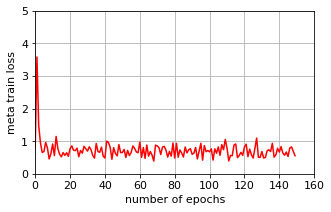

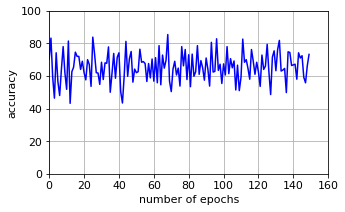

('histological_type', 'PCPG')
test acc:82.0
('colon_polyps_present', 'COADREAD')
test acc:71.0
('gender', 'LUNG')
test acc:60.000003814697266
('histological_type', 'UCEC')
test acc:63.0
('gender', 'BRCA')
test acc:88.0
('oct_embedded', 'THCA')
test acc:58.0
('oct_embedded', 'SKCM')
test acc:80.0
('anatomic_neoplasm_subdivision', 'OV')
test acc:73.0
('family_history_of_cancer', 'LGG')
test acc:62.0
('oct_embedded', 'LIHC')
test acc:65.0
('histological_type', 'LGG')
test acc:43.0
('lymphovascular_invasion_present', 'BLCA')
test acc:55.0
('gender', 'THCA')
test acc:73.0
('lymphovascular_invasion_present', 'HNSC')
test acc:64.0
('oct_embedded', 'SARC')
test acc:85.0
('_PANCAN_DNAMethyl_HNSC', 'HNSC')
test acc:41.0
('_EVENT', 'GBMLGG')
test acc:62.0
('mental_status_changes', 'GBMLGG')
test acc:75.0
('gender', 'COAD')
test acc:54.000003814697266
('_PANCAN_mirna_LUAD', 'LUAD')
test acc:32.0
('gender', 'LIHC')
test acc:65.0
('adjacent_hepatic_tissue_inflammation_extent_type', 'LIHC')
test acc:

In [21]:
meta_epochs = 25
meta_batch_size = 5
num_shots = 10
MLP_model = MultiLayerPerceptron(seed, input_size, num_classes, num_layer, channels, lr, batch_size, epochs, patience, weight_decay)
optimizer= torch.optim.Adam(params=MLP_model.parameters(), lr=MLP_model.learning_rate)
trained_model, _, _, _, _ = meta_train(meta_train_set[:30], optimizer, MLP_model, meta_epochs, meta_batch_size, num_shots)
avg_test_acc , result_dict = meta_test(trained_model, meta_test_set, optimizer, meta_batch_size)
sorted_x = sorted(result_dict.items(), key=lambda kv: kv[1])
sorted_dict = collections.OrderedDict(sorted_x)
print(sorted_x)
visualize_result(sorted_x)